# PHYS 25000 Final Project - Where's Waldo using a Neural Network

The goal of this project is train a model that can localize waldo within a scene, using a segmntation-based approach. Due to its demonstrated performance, U-Net style architecture will be used to map images to binary truth maps, thereby providing location information. The dataset was hand-generated using scanned copies of five Where's Waldo books. Truth data was generated by hand using Matlabs `imfreehand()` function.

### Part 1: Data Generation

To begin, I start by importing all of the libraries I will need for this project:

In [1]:
# Standard libraries
%matplotlib inline
from IPython.display import Image
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numpy.random as rng

# Libraries for image processing
from tqdm import tqdm_notebook, tnrange
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize, rescale
from skimage.morphology import label
from sklearn.model_selection import train_test_split
from cv2 import connectedComponentsWithStats


# Libraries for deep learning
import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from keras.layers.merge import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.utils import plot_model

Using TensorFlow backend.


The images are located in the "data/" folder. Since the images are very large, it is not practical to load the entire dataset. Due to the scanner used, .jpeg files were created, which is generally not ideal for image analysis. An example of an image and its truth is shown below: 

Several considerations for the data are as follows:
   1. The network should take 256x256 pixel image sizes
   1. Resizing the image distorts many of the fine features that could be used to identify waldo. Therefore, cropping the original images should give better results.
   1. Waldo's prevalence in the images is low, with only one waldo in an entire scene. I will start by training the network only with positive cases, in which the 256 pixel crop contains waldo in it. Depending on the performance of this initial training, I may continue to train the network using random crops for several epochs to teach the network not to expect waldo in every image.
   1. Given the limited dataset size, I would like to augment the data in such a way that waldo does not appear in the same position of a given image every time the netwwork sees it. The network should be trained on varying crops that contain Waldo, but don't need to be in the same place.
   1. Other data augmentation can be used. Horizontal flipping is included in the dataset, but given that waldo is always facing the same direction, it is not entirely applicable. If time, I would like to add a random zoom augmentation to account for differences in size between different images
   
In the following cell, I load the data into a dictionary and fill it with images that are cropped around the centroid of Waldo in the truth file such that all possible random 256 pixel crops are accessible.

In [2]:
im_height, im_width = 256,256
image_folder = 'image'
mask_folder = 'label'
direc = './data/' # Get current working directory
ext = '.jpg' # Select file delimiter

image_names = {} # Create an empty dict for images
mask_names = {} # Create an empty dict for masks
# Select only files with the ext extension
image_files = [i for i in os.listdir(os.path.join(direc,image_folder)) if os.path.splitext(i)[1] == ext]
mask_files = [i for i in os.listdir(os.path.join(direc,mask_folder)) if os.path.splitext(i)[1] == ext]
# Iterate over files
for f in image_files:
    if os.path.isfile(os.path.join(direc,image_folder,f)) and os.path.isfile(os.path.join(direc,mask_folder,f)):
    # Assign them to dictionaries
        image_names[f] = os.path.join(direc,image_folder,f)
        mask_names[f] = os.path.join(direc,mask_folder,f)

# Find centers of masks
centers = {}
for k in image_names.keys():
    im = np.array(imread(mask_names[k])).astype(np.uint8)
    nb_components, output, stats,centroids = connectedComponentsWithStats(im,connectivity=8)
    centers[k] = np.array([centroids[1][1],centroids[1][0]])
    
# Put cropped images into dictionaries    
image_dict = {}
mask_dict = {}
for i,k in enumerate(image_names.keys()):
    c = np.round((centers[k])).astype(int)
    im = np.array(imread(image_names[k]))
    mask = np.array(imread(mask_names[k]))
    size = [len(im),len(im[0])]
    image_dict[k] = im[np.max([c[0]-256,0]):np.min([c[0]+256,size[0]]),
                                                    np.max([c[1]-256,0]):np.min([c[1]+256,size[1]])]
    mask_dict[k] = mask[np.max([c[0]-256,0]):np.min([c[0]+256,size[0]]),
                                                  np.max([c[1]-256,0]):np.min([c[1]+256,size[1]])]

Let's take a look at the data so far:

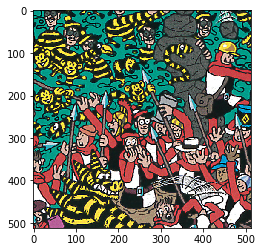

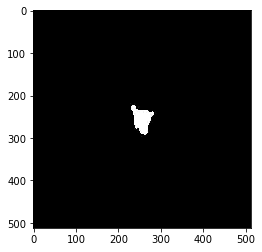

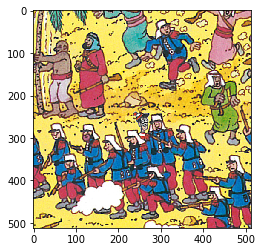

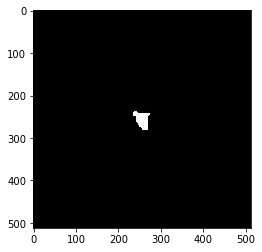

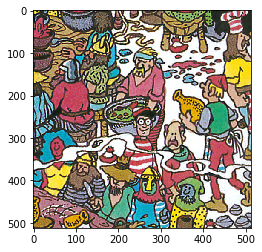

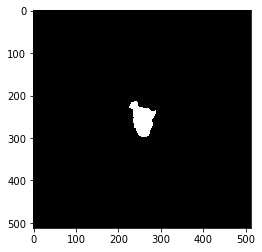

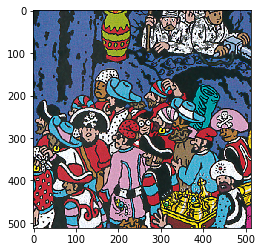

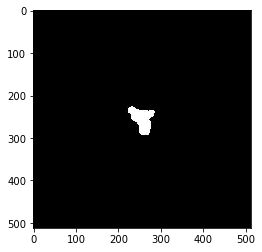

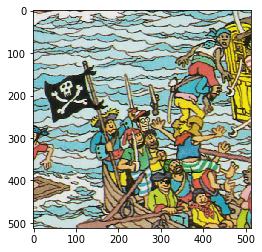

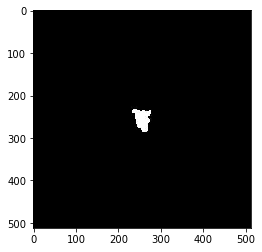

In [3]:
keys = image_dict.keys()
for k in keys[:5]:
    plt.figure()
    plt.imshow(image_dict[k])
    plt.figure()
    plt.imshow(mask_dict[k].astype(np.uint8),cmap='gist_gray')

Waldo is at the center, and the images are 512x512 pixels so all looks good.

Next I would like to randomly split the data into training, validation, and testing. A commonly used ratio is 65% training, 20% validation, and 15% testing, so I will start with that.

In [4]:
train_img = {}
val_img = {}
test_img = {}
train_mask = {}
val_mask = {}
test_mask = {}

files = np.random.choice(image_dict.keys(),len(image_dict.keys()),False)
for i in files[0:int(0.65*len(files))]:
    train_img[i] = image_dict[i]
    train_mask[i] = mask_dict[i]
for i in files[int(0.65*len(files)):int(0.85*len(files))]:
    val_img[i] = image_dict[i]
    val_mask[i] = mask_dict[i]
for i in files[int(0.85*len(files)):]:
    test_img[i] = image_dict[i]
    test_mask[i] = mask_dict[i]

As a precaution, let's check whether the data doesn't overlap:

/Users/Thomas/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


('length of training set = ', '29')
['40.jpg', '37.jpg', '45.jpg', '11.jpg', '19.jpg', '33.jpg', '38.jpg', '39.jpg', '41.jpg', '8.jpg', '42.jpg', '47.jpg', '26.jpg', '5.jpg', '3.jpg', '44.jpg', '22.jpg', '10.jpg', '28.jpg', '36.jpg', '30.jpg', '24.jpg', '12.jpg', '46.jpg', '21.jpg', '27.jpg', '32.jpg', '48.jpg', '13.jpg']


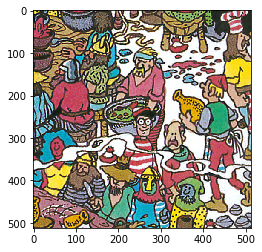

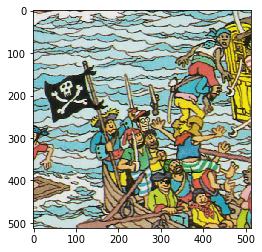

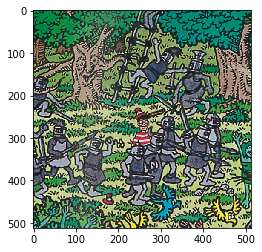

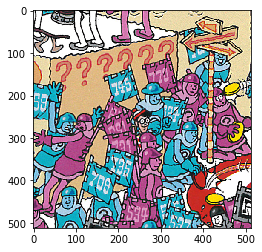

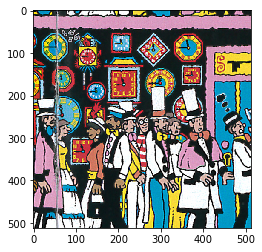

...

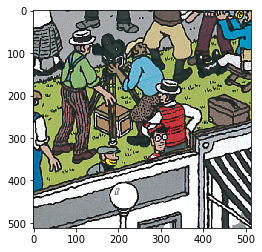

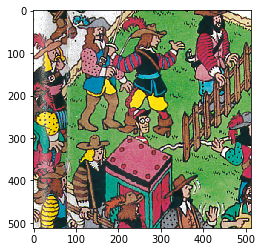

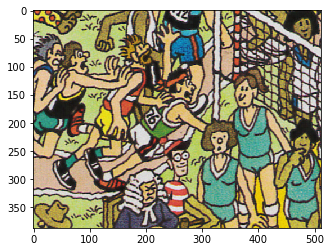

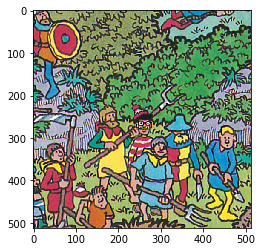

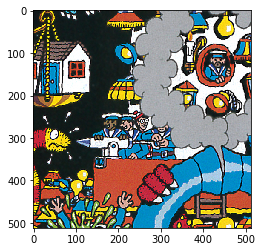

In [5]:
for k in train_img.keys():
    plt.figure()
    plt.imshow(train_img[k])
print('length of training set = ', str(len(train_img)))
print(train_img.keys())

('length of validation set = ', '10')


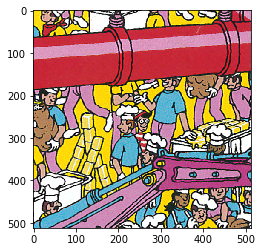

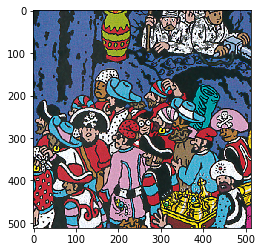

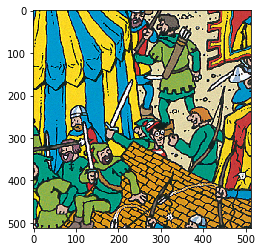

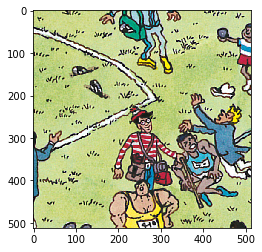

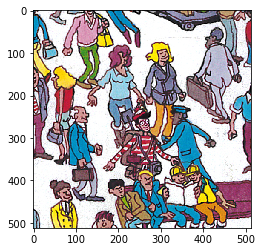

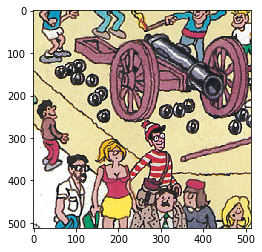

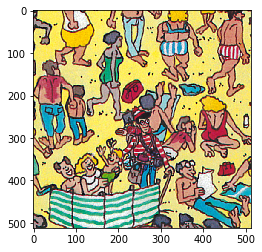

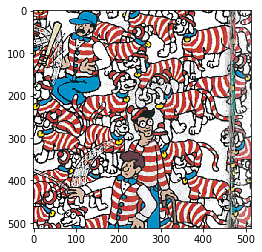

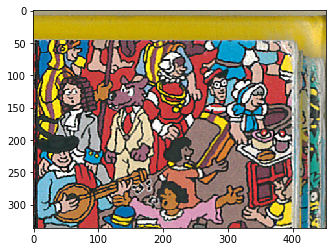

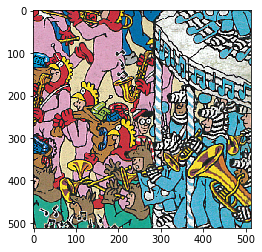

In [6]:
for k in val_img.keys():
    plt.figure()
    plt.imshow(val_img[k])
print('length of validation set = ', str(len(val_img)))

('length of testing set = ', '7')


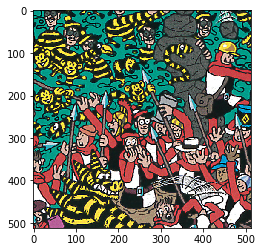

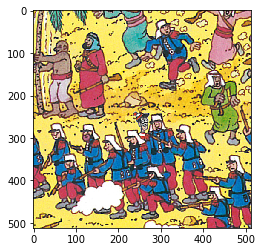

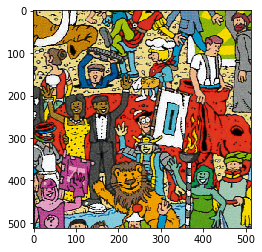

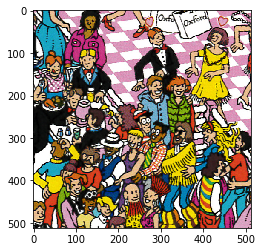

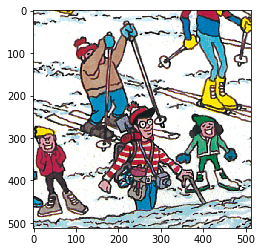

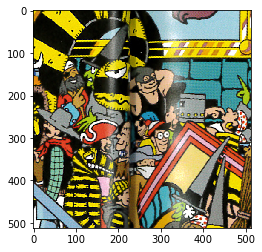

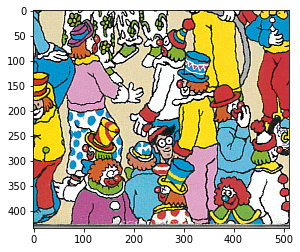

In [7]:
for k in test_img.keys():
    plt.figure()
    plt.imshow(test_img[k])
print('length of testing set = ', str(len(test_img)))

Everything looks good. Next I need an image generator that I can feed the network, meeting the criteria earlier. The generator allows me to randomly augment the data as the network trains, including random horizontal flipping.

In [8]:
def preprocess_input(img,mask,horizontal_flip = False):
    
    i,j = rng.randint(img.shape[0]-256),rng.randint(img.shape[1]-256)
    img = img[i:i+256,j:j+256,:]
    mask = mask[i:i+256,j:j+256]
    
    
    if horizontal_flip:
        if rng.randint(0,2) == 1:
            img,mask = np.fliplr(img), np.fliplr(mask)
    
    return(img,mask)
    

    
def image_generator(image_dict,mask_dict, batch_size = 16,pos_only = False,horizontal_flip = False):
    
    while True:
        
        x = np.empty((batch_size, 256,256,3)) 
        y = np.empty((batch_size, 256,256,1))
        # Read in each input, perform preprocessing and get labels
        
        if pos_only:
            count = 0
            while count < batch_size:
                k = rng.choice(image_dict.keys())
                img,mask = preprocess_input(image_dict[k],mask_dict[k],horizontal_flip)
                
                # Check to see if waldo's head is cut by border
                a=np.max(mask[0:256,0])+np.max(mask[0:256,255])+np.max(mask[0,0:256])+np.max(mask[255,0:256])
                
                if np.max(np.array(np.expand_dims(mask,axis=2))) > 0 and a == 0:
                    x[count] = np.array(img).astype(np.uint8)
                    y[count] = np.array(np.expand_dims(mask,axis=2))/255.
                    count = count+1
          
        else:
            for i in range(batch_size):
                k = rng.choice(image_dict.keys())
                img,mask = preprocess_input(image_dict[k],mask_dict[k],horizontal_flip)
                
                x[i] = np.array(img).astype(np.uint16)
                y[i] = np.array(np.expand_dims(mask,axis=2))/255.
        yield( (x, y) )
        
        
def showGen(image_dict, mask_dict, batch_size=16,pos_only = False,horizontal_flip=False):
    
    x = image_generator(image_dict, mask_dict, batch_size,pos_only,horizontal_flip)
    y = next(x)
    
    
    fig, axarr = plt.subplots(batch_size,2,figsize = (7,15))
    for i in range(batch_size):
        axarr[i,0].imshow(y[0][i].astype(np.uint8))
        axarr[i,0].set_xticks([])
        axarr[i,0].set_yticks([])
        axarr[i,1].imshow(np.squeeze(y[1][i]),cmap='gist_gray')
        axarr[i,1].set_xticks([])
        axarr[i,1].set_yticks([])
    
    axarr[0,0].set_title('Data',size = 30)
    axarr[0,1].set_title('Truth',size = 30)
    fig.tight_layout()
    fig.subplots_adjust(top=0.88)
    plt.savefig('./pictures/datagen.png',dpi=150)
    plt.show()

To check if the above works properly, I will use the `showGen()` function to test the different features

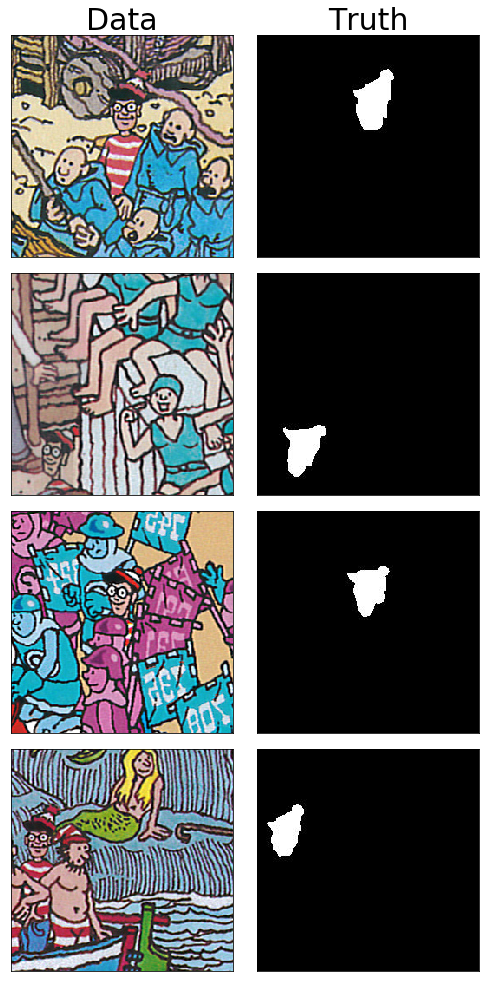

In [9]:
showGen(train_img, train_mask, batch_size=4,horizontal_flip=True,pos_only = True)

We also need a function that can generate non-repetitive validation and test crops:

In [10]:
def ValTestGen(img_dict,mask_dict,pos_only=True):
    x= np.empty((len(img_dict.keys()),256,256,3))
    y= np.empty((len(img_dict.keys()),256,256,1))
    if pos_only:    
        for i,k in enumerate(img_dict.keys()):
            b=True
            while b==True:
                img,mask = preprocess_input(img_dict[k],mask_dict[k])

                a=np.max(mask[0:256,0])+np.max(mask[0:256,255])+np.max(mask[0,0:256])+np.max(mask[255,0:256])

                if np.max(np.array(np.expand_dims(mask,axis=2))) > 0 and a == 0:
                    x[i] = np.array(img).astype(np.uint8)
                    y[i] = np.array(np.expand_dims(mask,axis=2))/255.
                    b=False
    # else tile
    return((x,y))

def showValTest(img_dict,mask_dict):
    imgs,masks = ValTestGen(img_dict,mask_dict)
    for i in range(len(imgs)):
        plt.figure()
        plt.subplot(1,2,1)
        plt.imshow(imgs[i].astype(np.uint8))
        plt.subplot(1,2,2)
        plt.imshow(np.squeeze(masks[i]),cmap='gist_gray')

Making sure everything works as expected:

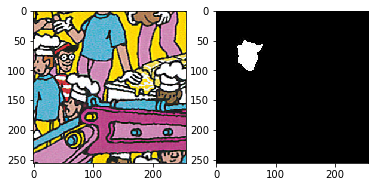

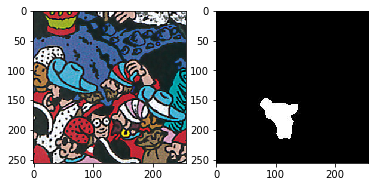

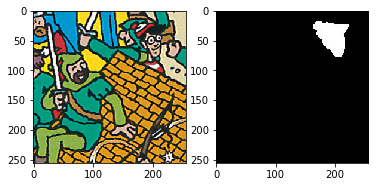

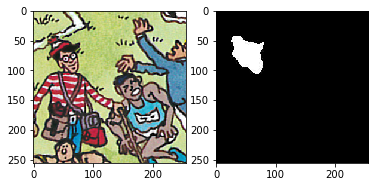

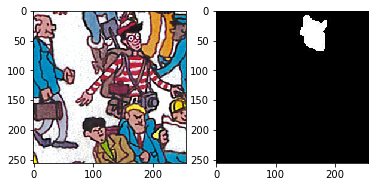

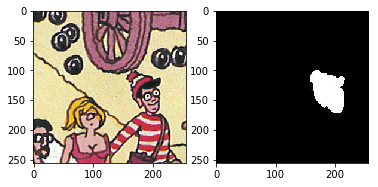

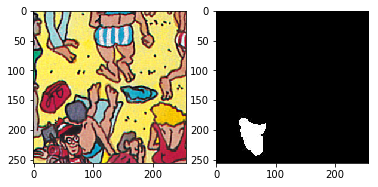

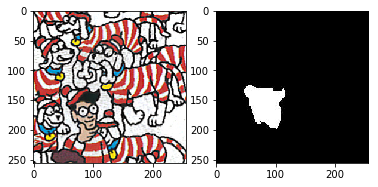

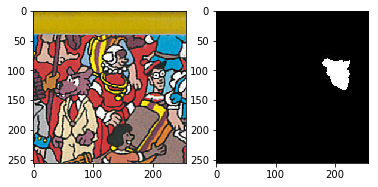

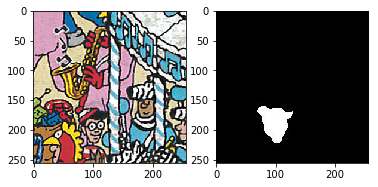

In [11]:
showValTest(val_img,val_mask)

Looks good. 

### Part 2: Construct and Train the Model

Now that the data is in a usable format, wwe can begin to think about creating a model. An effective network for image segmentation is U-Net, which can be found at: https://arxiv.org/abs/1505.04597

I define a model based on this architecture. I chose the netowrk to have 7 layers. I use batch normalization after each layer to account for low prevalence issues. For loss I am using binary crossentropy, and an Adam optimizer.

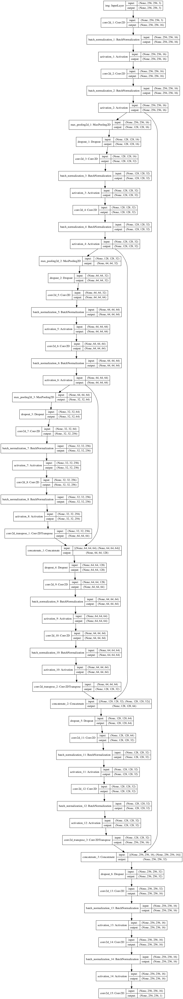

In [12]:
def conv2d_block(input_tensor, n_filters, kernel_size=3, batchnorm=True):
    # first layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    # second layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(x)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x


def get_unet(input_img, n_filters=16, dropout=0.5, batchnorm=True):
    # contracting path
    c1 = conv2d_block(input_img, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    p1 = MaxPooling2D((2, 2)) (c1)
    p1 = Dropout(dropout*0.5)(p1)

    c2 = conv2d_block(p1, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)
    p2 = MaxPooling2D((2, 2)) (c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)
    p3 = MaxPooling2D((2, 2)) (c3)
    p3 = Dropout(dropout)(p3)

    #c4 = conv2d_block(p3, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)
    #p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
    #p4 = Dropout(dropout)(p4)
    
    c5 = conv2d_block(p3, n_filters=n_filters*16, kernel_size=3, batchnorm=batchnorm)
    
    # expansive path
    #u6 = Conv2DTranspose(n_filters*8, (3, 3), strides=(2, 2), padding='same') (c5)
    #u6 = concatenate([u6, c4])
    #u6 = Dropout(dropout)(u6)
    #c6 = conv2d_block(u6, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)

    u7 = Conv2DTranspose(n_filters*4, (3, 3), strides=(2, 2), padding='same') (c5)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)

    u8 = Conv2DTranspose(n_filters*2, (3, 3), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)

    u9 = Conv2DTranspose(n_filters*1, (3, 3), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    
    outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

input_img = Input((im_height, im_width, 3), name='img')
model = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)

model.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=["accuracy"])

# Plot model
plot_model(model, to_file='model_schematic.png',show_shapes=True)
Image("model_schematic.png")

Now I simply train the network using the functions and models I have already defined. Training takes about an hour or two on a CPU:

In [13]:
callbacks=[ModelCheckpoint('model.h5', verbose=1, save_best_only=True, save_weights_only=False),
           EarlyStopping(patience=5,verbose=1)]

train_gen = image_generator(train_img,train_mask,batch_size=16, pos_only=True,horizontal_flip=True)

history = model.fit_generator(train_gen,steps_per_epoch=20,epochs=30,callbacks=callbacks,
                              validation_data = ValTestGen(val_img,val_mask))

/Users/Thomas/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in ubyte_scalars
  # Remove the CWD from sys.path while we load stuff.


Epoch 1/30


/Users/Thomas/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: overflow encountered in ubyte_scalars


20/20 [==============================] - 440s 22s/step - loss: 0.7135 - acc: 0.5836 - val_loss: 0.7607 - val_acc: 0.6862

Epoch 00001: val_loss improved from inf to 0.76070, saving model to model.h5
Epoch 2/30
20/20 [==============================] - 400s 20s/step - loss: 0.4793 - acc: 0.9519 - val_loss: 0.6521 - val_acc: 0.8546

Epoch 00002: val_loss improved from 0.76070 to 0.65210, saving model to model.h5
Epoch 3/30
20/20 [==============================] - 403s 20s/step - loss: 0.4181 - acc: 0.9599 - val_loss: 0.5383 - val_acc: 0.9332

Epoch 00003: val_loss improved from 0.65210 to 0.53829, saving model to model.h5
Epoch 4/30
20/20 [==============================] - 385s 19s/step - loss: 0.3663 - acc: 0.9617 - val_loss: 0.3648 - val_acc: 0.9600

Epoch 00004: val_loss improved from 0.53829 to 0.36481, saving model to model.h5
Epoch 5/30
20/20 [==============================] - 363s 18s/step - loss: 0.3175 - acc: 0.9638 - val_loss: 0.3459 - val_acc: 0.9560

Epoch 00005: val_loss impr

To check for overfitting and see how training went, I plot the training and validation loss as a function of epoch

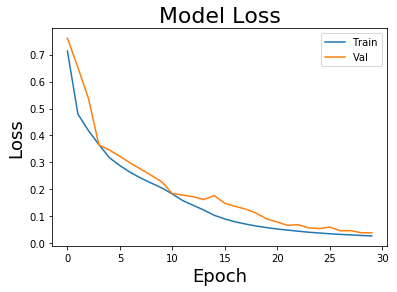

In [37]:
# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss',size = 22)
plt.ylabel('Loss',size = 18)
plt.xlabel('Epoch',size=18)
plt.legend(['Train', 'Val'], loc='upper right')
plt.savefig('./pictures/loss.png',dpi=300,bbox_inches = 'tight')
plt.show()

### Part 3: Evaluate Network Performance

Plot all test results

/Users/Thomas/anaconda/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: overflow encountered in ubyte_scalars
  # Remove the CWD from sys.path while we load stuff.


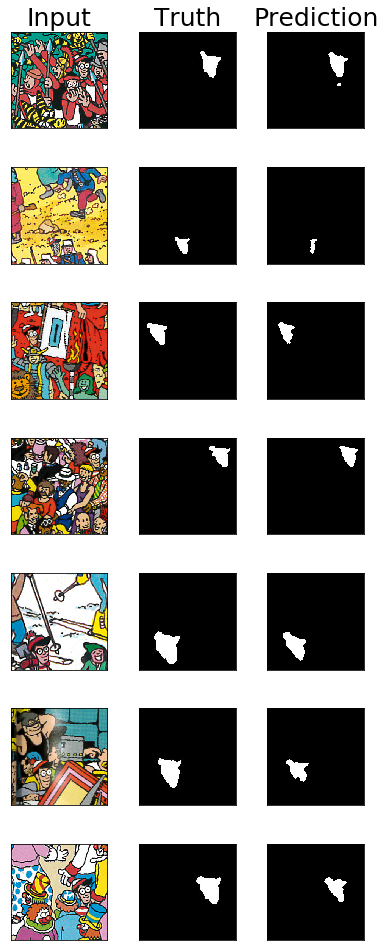

In [38]:
test_data = ValTestGen(test_img,test_mask)
test_preds = model.predict(test_data[0])
test_preds_t = (test_preds > 0.5).astype(np.uint8)

batch_size = len(test_data[0])

fig, axarr = plt.subplots(batch_size,3,figsize = (5.5,15))
for i in range(batch_size):
    axarr[i,0].imshow(test_data[0][i].astype(np.uint8))
    axarr[i,0].set_xticks([])
    axarr[i,0].set_yticks([])
    axarr[i,1].imshow(np.squeeze(test_data[1][i]),cmap='gist_gray')
    axarr[i,1].set_xticks([])
    axarr[i,1].set_yticks([])
    axarr[i,2].imshow(np.squeeze(test_preds_t[i]),cmap='gist_gray')
    axarr[i,2].set_xticks([])
    axarr[i,2].set_yticks([])
    
    
axarr[0,0].set_title('Input',size = 25)    
axarr[0,1].set_title('Truth',size = 25)    
axarr[0,2].set_title('Prediction',size = 25)    
fig.tight_layout()
fig.subplots_adjust(top=0.88)
plt.savefig('./pictures/results.png',dpi=300,bbox='tight')
plt.show()

Calculate IoU for these images:

In [39]:
def iou(mask,pred):

    intersection = float(np.sum((mask + pred) > 1))
    union = np.sum((mask + pred) >= 1)
    
    return(intersection/union)

iou_list = np.empty(batch_size)
for i in range(batch_size):
    iou_list[i] = iou(np.squeeze(test_data[1][i]),np.squeeze(test_preds_t[i]))
    
print("Mean IoU = " + str(np.mean(iou_list)))
print(iou_list)

Mean IoU = 0.747910213044
[ 0.87868852  0.44922737  0.80980861  0.89377499  0.74153665  0.71261426
  0.74972109]


Pretty good!

I need to generalize the 256 pixel outputs to an entire image. This can be done simply by tiling the input and combining the output of each tile. 

In [40]:
def predFull(img):
    # Pad with zeros until the image is evenly divisible into 256 pixel tiles
    img = np.append(img, np.zeros((len(img)%256,len(img[0]),3)),axis = 0)
    img = np.append(img, np.zeros((len(img),len(img[0])%256,3)),axis = 1)
    
    # Fill prediction image tile by tile
    pred = np.zeros((len(img),len(img[0]))).astype(np.uint8)
    for i in range(len(img)//256):
        for j in range(len(img[0])//256):
            im = np.expand_dims(img[256*i:256*(i+1),256*j:256*(j+1),:],axis=0)
            a = np.squeeze(model.predict(im))
            pred[256*i:256*(i+1),256*j:256*(j+1)] = (a>0.5).astype(np.uint8)
            
    return(pred)

Now using the prediction, I extract the two largest centroids. The reason I chose two is because many images contain Wenda, who to the computer (and me) is almost the same as Waldo. Since Wenda is not necessarily wrong, and I didn't train on Wenda, I allow the computer to find her too.

In [41]:
def saveFind(img,save_num):
    pred = predFull(img)
    nb_components, output, stats, centroids = connectedComponentsWithStats(pred,connectivity=8)
    plt.figure()
    plt.imshow(pred,cmap='gist_gray')
    plt.savefig('./pictures/pred%s.png'%(save_num),dpi=500,bbox='tight')

    if len(stats[1:] == 1):
        ix1 = np.argmax(stats[1:,4])+1
    else: 
        return('Waldo not found :(')

    plt.figure()
    plt.imshow(img)
    plt.plot(centroids[ix1][0], centroids[ix1][1], 'o',
            ms=10, mec='b', mfc='none', mew=2)
    plt.savefig('./pictures/example%s.png'%(save_num),dpi = 500,bbox='tight')

Evaluate all test images

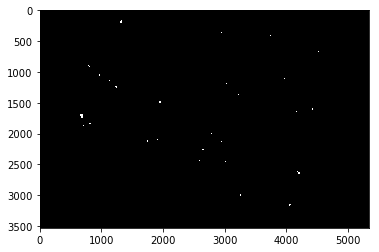

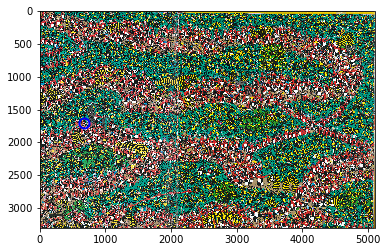

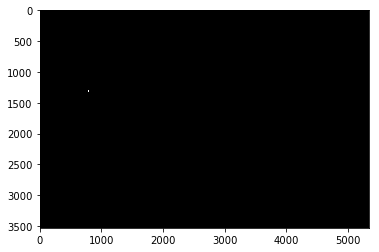

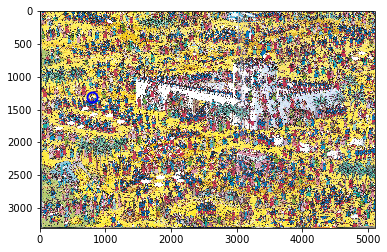

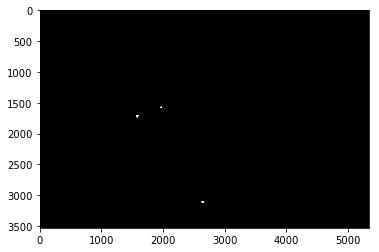

...

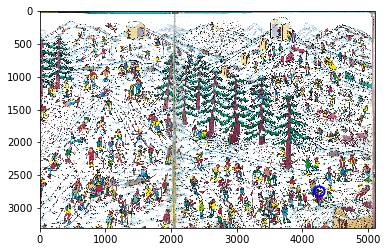

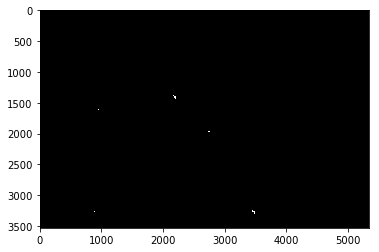

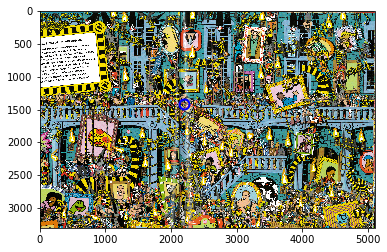

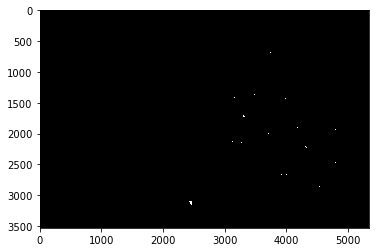

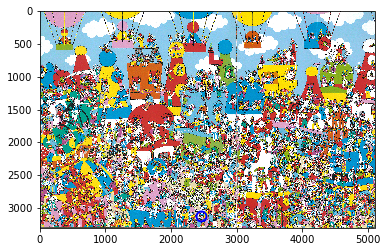

In [42]:
for i,k in enumerate(test_img.keys()):
    saveFind(imread('./data/image/'+k),i)

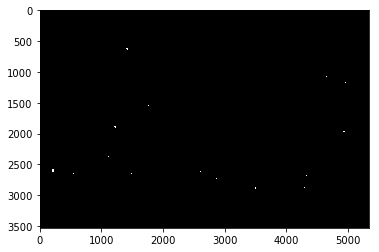

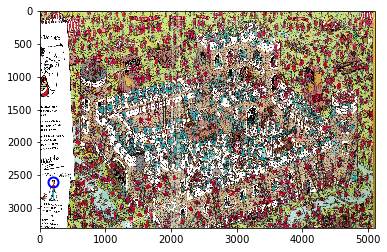

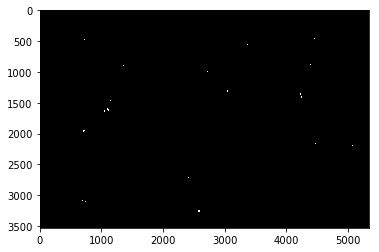

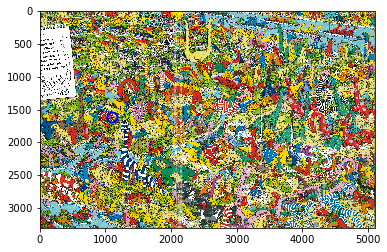

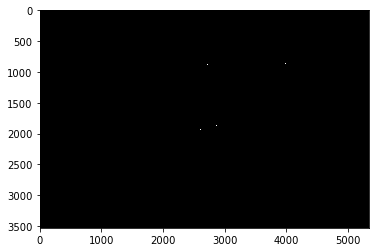

...

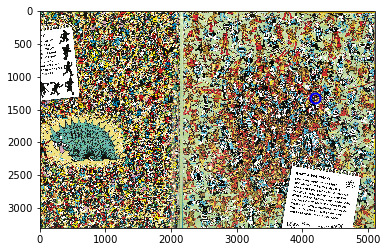

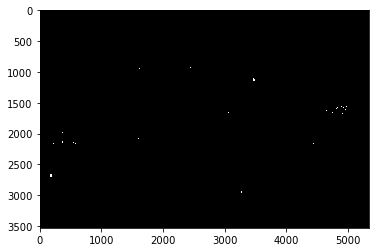

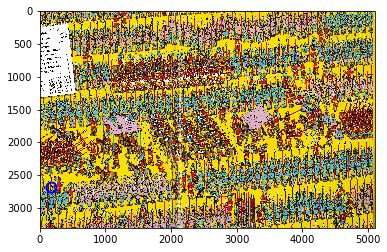

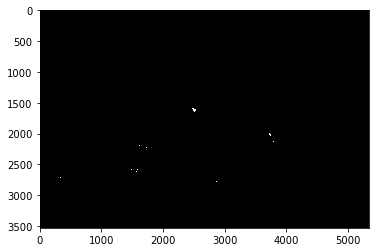

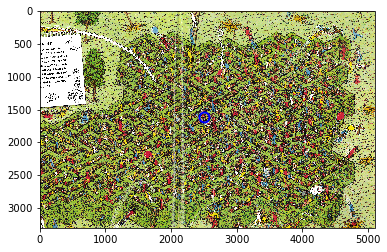

In [43]:
for i in range(6):
    saveFind(imread('./test_data/%s.jpg'%(i)),i+7)